In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np 
from bokeh.plotting import show, output_notebook
import pandas as pd
import socket
os.chdir('/lustre/scratch126/cellgen/team205/ny1/tissuetag/')
import tissue_tag as tt
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/')
import imagespot as ims
import matplotlib.pyplot as plt
import scanpy as sc
output_notebook()
host = '5011'

Loading BokehJS ...

# Step 0 - Preprocessing (make sure allgnment is done properly!)

In [3]:
# specify path to visium mapped object and the original image for allignment
vis_path = '/nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/WSSS_THYst9518030/'
impath = '/nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/WSSS_THYst9518030/V19D02-039__U11_FO2_03__A1.jpg'

Scaling images and saving
Running Cellpose model for fiducial detection
   label  area  equivalent_diameter   perimeter  centroid-0   centroid-1
0      1   554            26.558891   92.769553   12.265343  3708.451264
1      2  2368            54.909300  179.681241  128.365709   220.390203
2      3  2289            53.985603  176.509668  129.590214  1845.931848
3      4  2300            54.115164  177.095454  129.999130  2169.404348
4      5  2352            54.723481  178.267027  130.625000   544.206207
found - 587 Candidate points
[[0, 585], [1, 554], [2, 518], [3, 499], [7, 58], [8, 28], [9, 1], [12, 456], [15, 549], [17, 500], [20, 432], [21, 14], [22, 578], [23, 529], [25, 85], [26, 34]]
Finding Transformation Matrix
[[0, 585], [1, 554], [2, 518], [3, 499], [7, 58], [8, 28], [9, 1], [12, 456], [15, 549], [17, 500], [20, 432], [21, 14], [22, 578], [23, 529], [25, 85], [26, 34]]
[[-1.33880130e-04 -1.09702605e+00  1.30886720e+04]
 [ 1.10086472e+00 -1.09021743e-03 -3.23899259e+04]
 [ 

<Figure size 432x288 with 0 Axes>

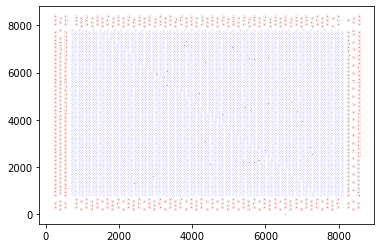

DONE!
Done!


<Figure size 1200x800 with 0 Axes>

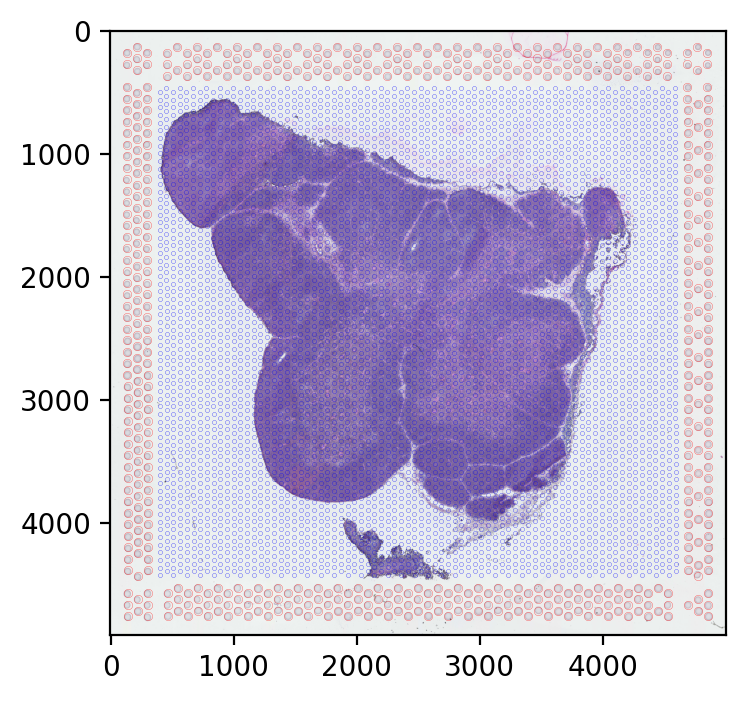

In [6]:
# this allignes (ransac) the visium image to the fiducial frame reference (in ReferenceData from 10X) and generates an additional 5K resolution image in additon to the usuall'hires' 'lowres'
ims.align_and_extract(
    path_10x=vis_path,
    path_image=impath,
    ref_path='/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/ReferenceData/',
    use_10X_allignment=False)
# make sure that the allignemnt worked!

Otsu threhold found to be - 183.0
              Barcode  UnderTissue  Col  Row            X           Y
0  ACGCCTGACACGCGCT-1          0.0  0.0  0.0  7789.735164  709.358585
1  TACCGATCCAACACTT-1          0.0  1.0  1.0  7734.872215  805.079304
2  ATTAAAGCGGACGAGC-1          0.0  0.0  2.0  7680.032560  709.249563
3  GATAAGGGACGATTAG-1          0.0  1.0  3.0  7625.169610  804.970283
4  GTGCAAATCACCAATA-1          0.0  0.0  4.0  7570.329955  709.140541


<Figure size 1280x960 with 0 Axes>

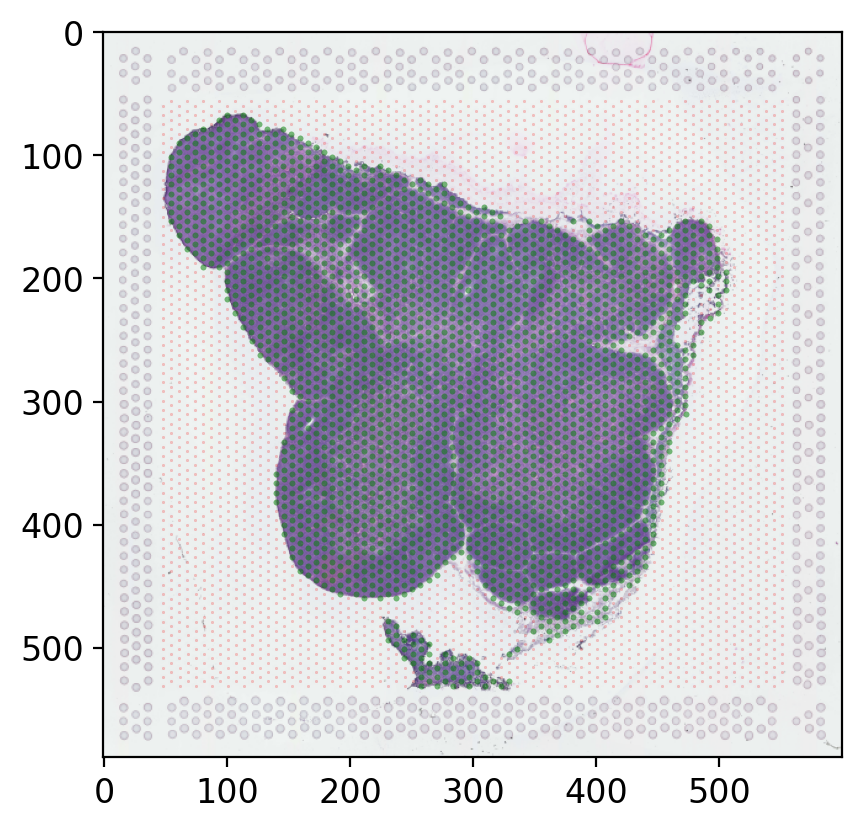

,Barcode,UnderTissue,Col,Row,X,Y
0,ACGCCTGACACGCGCT-1,0.0,0.0,0.0,7789.735164,709.358585
1,TACCGATCCAACACTT-1,0.0,1.0,1.0,7734.872215,805.079304
2,ATTAAAGCGGACGAGC-1,0.0,0.0,2.0,7680.032560,709.249563
3,GATAAGGGACGATTAG-1,0.0,1.0,3.0,7625.169610,804.970283
4,GTGCAAATCACCAATA-1,0.0,0.0,4.0,7570.329955,709.140541
...,...,...,...,...,...,...
4987,GAACGTTTGTATCCAC-1,0.0,77.0,123.0,1042.128112,8077.346509
4988,ATTGAATTCCCTGTAG-1,0.0,76.0,124.0,987.288457,7981.516768
4989,TACCTCACCAATTGTA-1,0.0,77.0,125.0,932.425507,8077.237488
4990,AGTCGAATTAGCGTAA-1,0.0,76.0,126.0,877.585852,7981.407746


In [9]:
# this performs tissue detection by otsu threholding, play around with sensitivity (0.5-1.5) to catch more/less of the tissue
ims.detect_tissue_otsu(path=vis_path,ref_path='/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/ReferenceData/',sensitivity=1.2)

# step 1 - Annoation with TissueTag

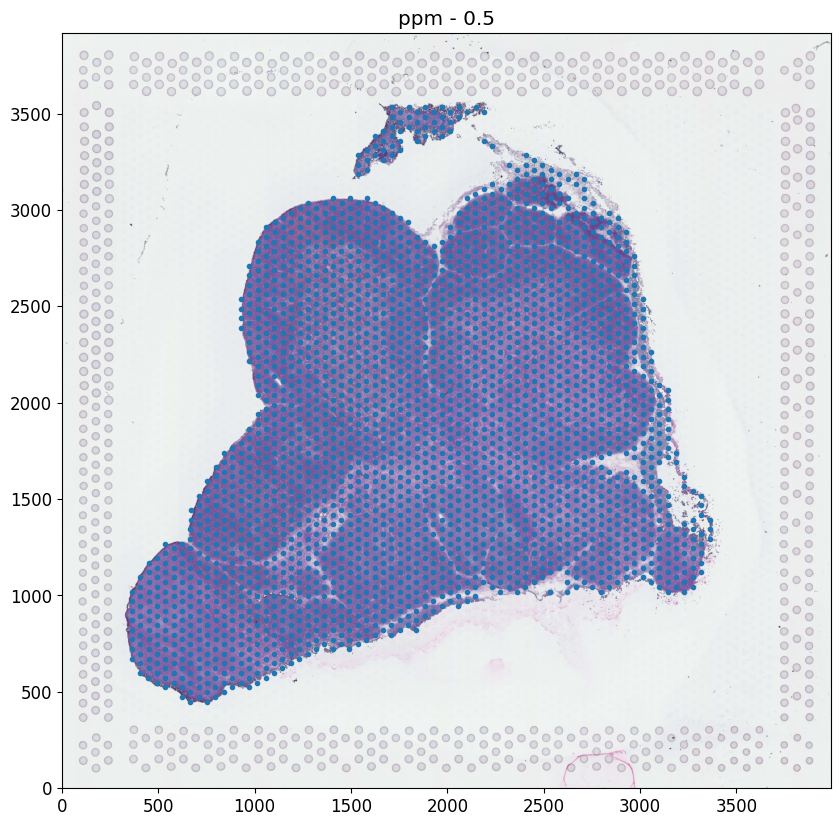

In [12]:
# here we read the visium object and use the new hires5K resolution 
plt.figure(figsize=[10,10],dpi=100)
im,ppm,df = tt.read_visium(spaceranger_dir_path=vis_path+'imagespot_preprocessing/',use_resolution='hires5K',res_in_ppm=0.5)

In [5]:
# define annotations Lv0 
annodict = {
    'unassigned':'yellow',
    'Artifacts':'black',
    'Medulla':'green',
    'Cortex':'cyan',
    'Edge':'brown',
    'HS':'magenta',
    'Vessels':'blue',
    'PVS':'red',
    'Other':'orange',
}
result = np.zeros(im.shape[:2], dtype=np.uint8)

## proceed to semi-automated annotations

In [10]:
# generate automated labels from markers

# these marker genes would be used to train the classifier in later stages or just to define the annotations if going with the manual option 
gene_markers = { 
    'Medulla' : 'AIRE',
    'Cortex' : 'ARPP21',
    # 'HS' : 'IVL',
    # 'Vessels' : 'CD34',
}
labels_per_marker = { # how many spots per marker gene
    'Medulla' : 50,
    'Cortex' : 150,
    # 'HS' : 15,
    # 'Vessels' : 15,
}
r = 100

AIRE
ARPP21


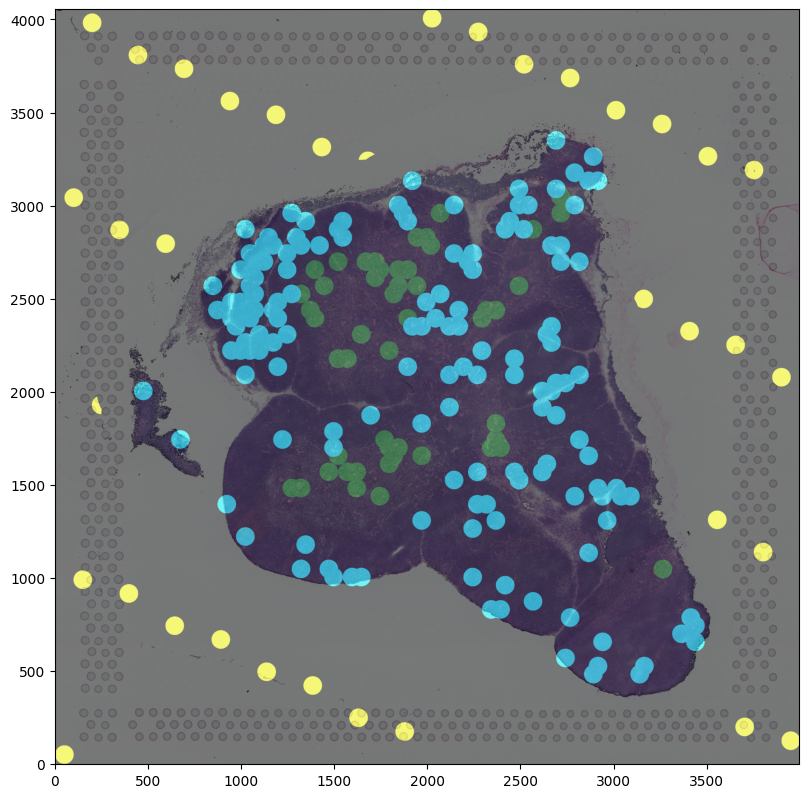

In [23]:
adata = sc.read_visium(vis_path,count_file='raw_feature_bc_matrix.h5')
adata = adata[df.index.intersection(adata.obs.index)]
training_labels = tt.background_labels(im.shape[:2],coordinates,every_x_spots = 100,r=r*ppm) # generate background labels 
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
training_labels = tt.gene_labels(adata,df,training_labels,gene_markers,annodict,r*ppm,labels_per_marker)
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_lebels(im,training_labels_rgb,alpha=0.5)

## (optional) Predict regions from image

## scribble initial annotations

In [6]:
p, render_dict = tt.scribbler(im,annodict,plot_scale=1)
def app(doc):
    global p
    doc.add_root(p)
    
host = '5011' 
import socket
show(app,notebook_url=f'{socket.gethostname()}:'+host) # determine if working on a server or local environment, if working on a local pc - 'local', while working on server instance indicate the port number e.g. 5011 (string)
print('wait for it.. can take a few tens of seconds on farm...')

wait for it.. can take a few tens of seconds on farm...


## plot scribble anotations  

unassigned
Artifacts
Medulla
Cortex
Edge
HS
Vessels
PVS


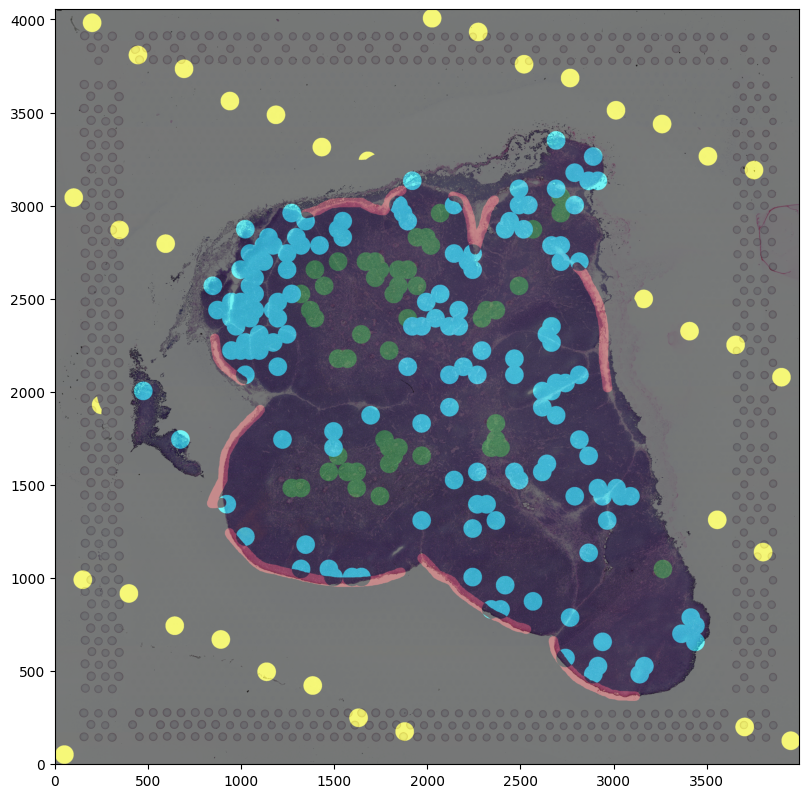

In [27]:
line_width = 100 # microns
training_labels_scrib = tt.scribble_to_labels(im,render_dict,line_width=line_width*ppm)
training_labels = training_labels + training_labels_scrib
training_labels_rgb = tt.rgb_from_labels(training_labels,colors=list(annodict.values()))
out = tt.overlay_lebels(im,training_labels_rgb,alpha=0.5)

## run the RF classifier 

CPU times: user 3min 10s, sys: 24 s, total: 3min 34s
Wall time: 55.5 s


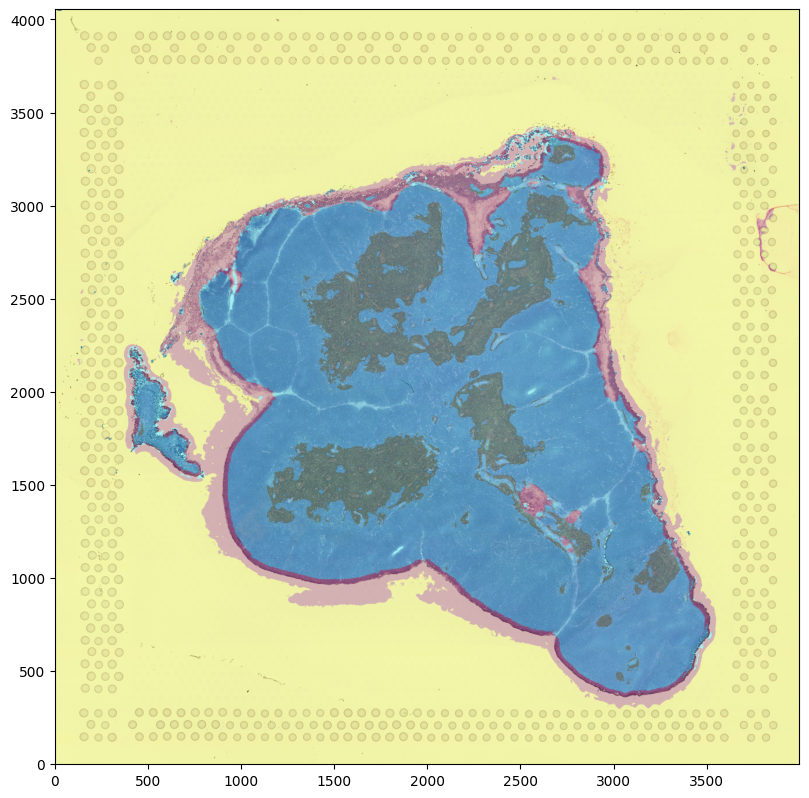

In [28]:
%%time

# this step takes about 30s to 5 min depending on number of training areas and resolution  
result = tt.sk_rf_classifier(im,training_labels)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.7)

## Manually draw annotations or Correct forest annotations

## optinal - load a previuos annotated image 

In [147]:
result,annotations_level_0_labels,ppm,annodict = tt.load_annotation(vis_path+'/imagespot_preprocessing/tissue_annotations/','annotations_level_0',load_colors=True)
# annodict = {
#     'unassigned':'yellow',
#     'Artifacts':'black',
#     'Medulla':'green',
#     'Cortex':'cyan',
#     'Edge':'brown',
#     'HS':'magenta',
#     'Vessels':'blue',
#     'PVS':'red',
#     'Other':'orange',
# }

loaded annotation image - annotations_level_0 size - (4055, 3998)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}


In [8]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict,fig_downsize_factor=4)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

In [143]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)

## done? great. not done? return to manual corrections and repeat until happy :) 

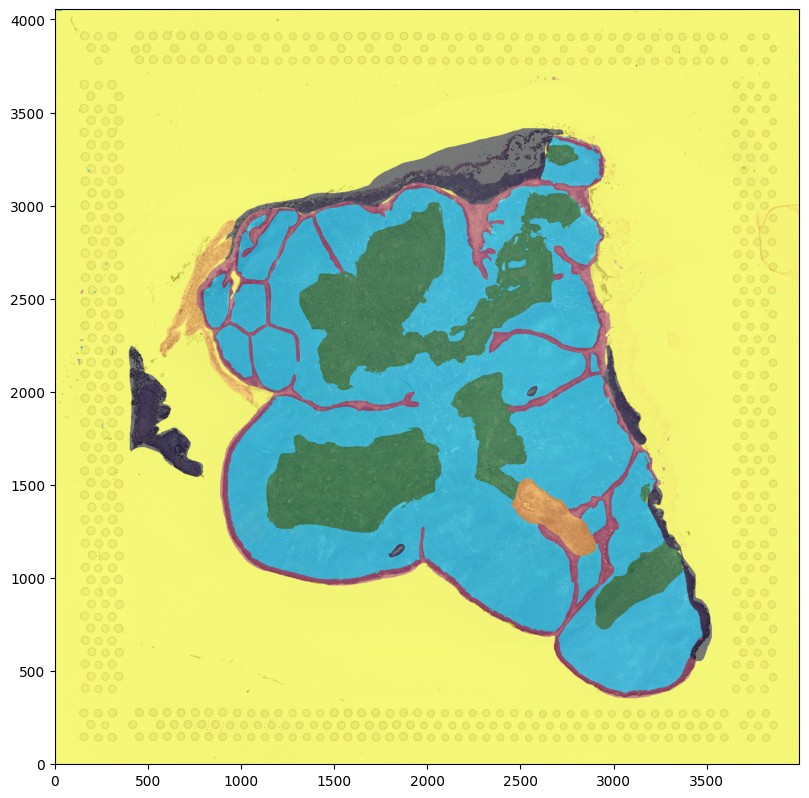

In [144]:
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_lebels(im,result_rgb,alpha=0.5)

## save annotation level 0

In [145]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/imagespot_preprocessing/tissue_annotations')
    
tt.save_annotation(
    folder=vis_path+'/imagespot_preprocessing/tissue_annotations/',
    label_image=result,
    file_name='annotations_level_0',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm,
)

## annotations level 1 - via manual annotations

In [97]:
# generate new annotation 
# result = np.zeros(im.shape[:2], dtype=np.uint8)+1


array([1, 2, 3], dtype=uint8)

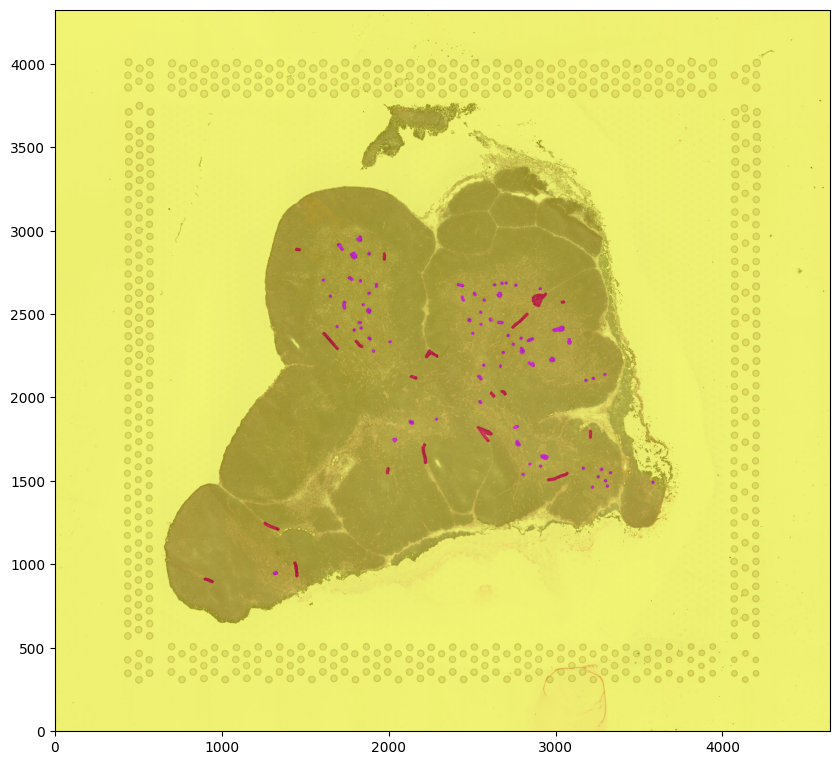

In [23]:
# read lv 1
# define annotations Lv1
annodict = {
    'unassigned':'yellow',
    'PVS':'red',
    'HS':'magenta',
    'fat':'black',
    # 'vessels':'blue',
}

# optional if not going for step 2 bypass classifier 
# result = np.ones(im.shape[:2], dtype=np.uint8)+1

import cv2
from PIL import Image
result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lv_1.tif'))
result = result + np.zeros(result.shape[:2], dtype=np.uint8)+1
result[np.where(result==4)] = 1 # correct gap in aanotation 
result = cv2.resize(result, (im.shape[1], im.shape[0]), interpolation = cv2.INTER_NEAREST)
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)
np.unique(result)

## Manually draw annotations or Correct old annotations

In [25]:
# at this stage, if you are adding annotations make sure they come after the current ones otherwise it will mess up everything
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,out_img,anno_dict=annodict)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update annotations 

PVS


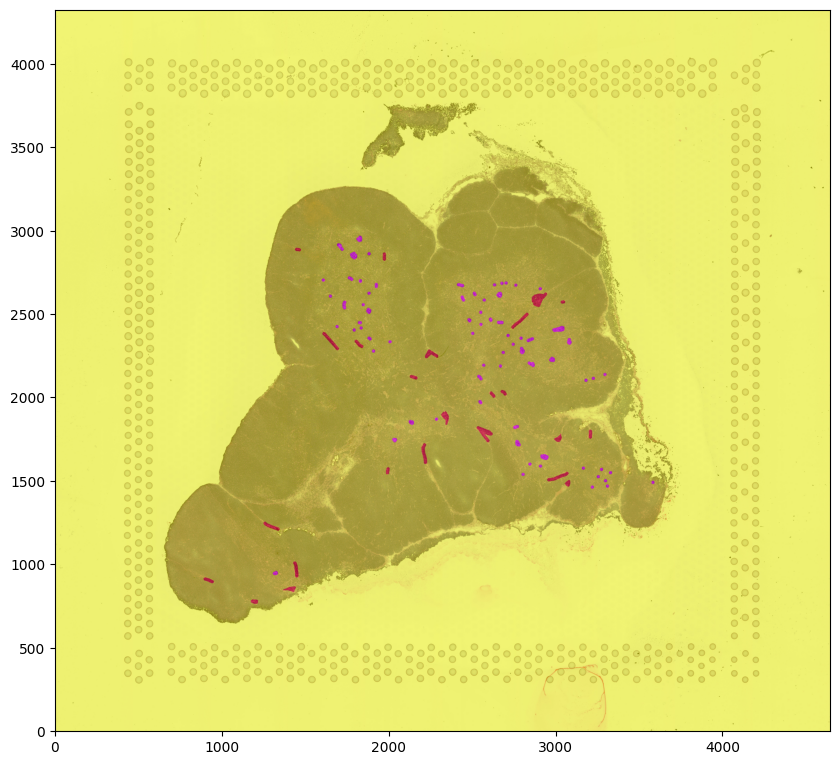

In [26]:
out_img, result = tt.update_annotator(im,result,anno_dict=annodict,render_dict=render_dict,alpha=0.5)
# plot result 
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

## save annotation level 1

In [27]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_level_1',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

## Read old lobule annotations

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19], dtype=int32)

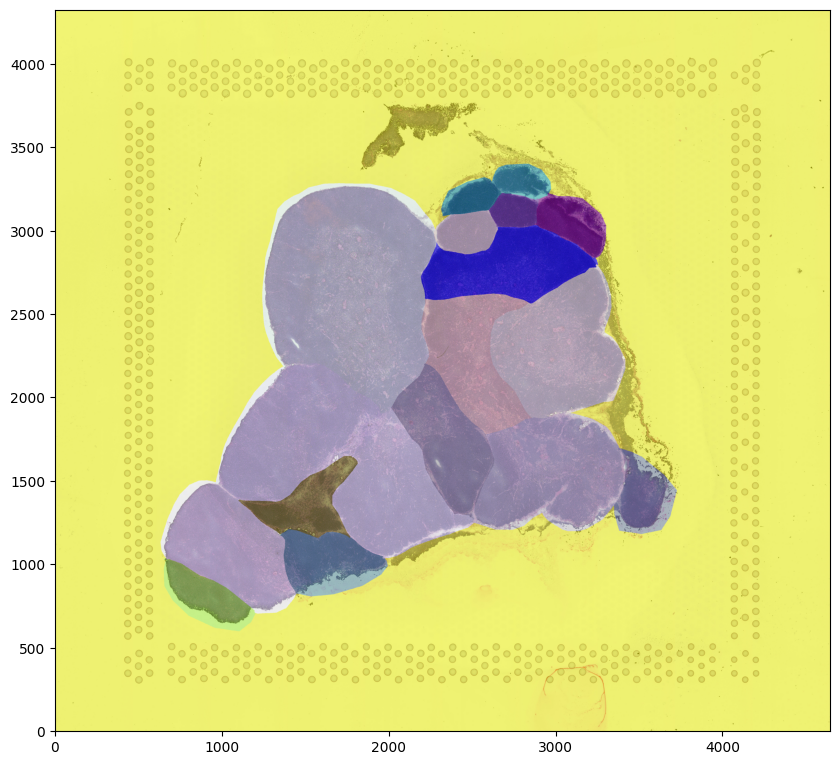

In [30]:
import cv2
from PIL import Image
import random
import matplotlib.colors as mcolors

# result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lobules.tif'))
result = np.array(Image.open(vis_path+'/tissue_annotations/Annotation_lobules_1.tif'))

np.unique(result)
# define annotations Lv0 
colorpool = list(mcolors.CSS4_COLORS.keys())
# result = result + np.zeros(result.shape[:2], dtype=np.uint8)+1

# get unique values in the array
unique_values = np.unique(result)

# Create bins that start from each unique value minus 0.5, so that np.digitize will find the right indices
bins = unique_values - 0.5

# use np.digitize to get the new values
result = np.digitize(result, bins, right=True)

base_name = 'lobule'
annodict = {'unassigned': 'yellow'}
for l in np.unique(result):
    annodict[base_name+'_'+str(l)] = random.choice(colorpool)

result = cv2.resize(result, (im.shape[1], im.shape[0]), interpolation = cv2.INTER_NEAREST)
result_rgb = tt.rgb_from_labels(result,colors=list(annodict.values()))
out_img = tt.overlay_labels(im,result_rgb,alpha=0.5)

np.unique(result)

## save annotation - lobules

In [13]:
isExist = os.path.exists(vis_path+'tissue_annotations')
if not(isExist):
    os.mkdir(vis_path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=vis_path+'/tissue_annotations/',
    label_image=result,
    file_name='annotations_lobules_1',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm
)

# Step 2 - Move annotations to anndata

In [21]:
vis_path = '/nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518030/'
# spot_diameter = 15 # in microns
# df, ppm_grid = tt.load_and_combine_annotations(
#     folder=vis_path+'tissue_annotations/',
#     file_names=['annotations_level_0', 'annotations_level_1', 'annotations_lobules_0'],
#     spot_diameter=spot_diameter
# )

# this bit reads the annotation images from "tissuetaged" images and fits an hexagonal grid over the image to sample the observations, the grid resolution is uniquely defined based in the spot diameter (im microns)  
spot_diameter = 15 # in microns
df_morph, ppm_morph = ims.load_and_combine_annotations(
    folder=vis_path+'/tissue_annotations/',
    file_names=['annotations_level_0', 'annotations_level_1', 'annotations_lobules_0'],
    spot_diameter=spot_diameter
)

loaded annotation image - annotations_level_0 size - (4325, 4644)
loaded annotations
{1: 'unassigned', 2: 'Cortex', 3: 'Medulla', 4: 'Edge', 5: 'Artifacts'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Cortex': 'cyan', 'Medulla': 'green', 'Edge': 'brown', 'Artifacts': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_0


357740it [01:22, 4332.26it/s]


loaded annotation image - annotations_level_1 size - (4325, 4644)
loaded annotations
{1: 'unassigned', 2: 'PVS', 3: 'HS', 4: 'fat'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'PVS': 'red', 'HS': 'magenta', 'fat': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_1


357740it [01:23, 4304.04it/s]


loaded annotation image - annotations_lobules_0 size - (4325, 4644)
loaded annotations
{1: 'unassigned', 2: 'lobule_1', 3: 'lobule_2', 4: 'lobule_3', 5: 'lobule_4', 6: 'lobule_5', 7: 'lobule_6', 8: 'lobule_7', 9: 'lobule_8', 10: 'lobule_9', 11: 'lobule_10', 12: 'lobule_11', 13: 'lobule_12', 14: 'lobule_13', 15: 'lobule_14', 16: 'lobule_15'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'lobule_1': 'khaki', 'lobule_2': 'darkseagreen', 'lobule_3': 'orangered', 'lobule_4': 'darkmagenta', 'lobule_5': 'darkgoldenrod', 'lobule_6': 'aqua', 'lobule_7': 'olive', 'lobule_8': 'skyblue', 'lobule_9': 'mediumturquoise', 'lobule_10': 'tan', 'lobule_11': 'lightcoral', 'lobule_12': 'burlywood', 'lobule_13': 'mediumblue', 'lobule_14': 'navajowhite', 'lobule_15': 'darkslategray'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_lobules_0


357740it [01:23, 4288.85it/s]


In [22]:
# remove background spots if you are not interested in it!
df_morph = df_morph.iloc[np.where(df_morph['annotations_level_0']!='unassigned')[0],:]
df_morph = df_morph.iloc[np.where(df_morph['annotations_level_0']!='Artifacts')[0],:]
df_morph

,x,y,annotations_level_0,annotations_level_0_number,annotations_level_1,annotations_level_1_number,annotations_lobules_0,annotations_lobules_0_number
index,,,,,,,,
18252,471.145630,2738.663086,Edge,4,unassigned,1,unassigned,1
18261,471.145630,2806.006836,Edge,4,unassigned,1,unassigned,1
18262,471.145630,2813.489502,Edge,4,unassigned,1,unassigned,1
18301,471.145630,3105.312500,Edge,4,unassigned,1,unassigned,1
18302,471.145630,3112.795166,Edge,4,unassigned,1,unassigned,1
...,...,...,...,...,...,...,...,...
341147,4217.723145,1058.819458,Edge,4,unassigned,1,unassigned,1
341426,4217.723145,3146.475586,Edge,4,unassigned,1,unassigned,1
341427,4217.723145,3153.958252,Edge,4,unassigned,1,unassigned,1


In [23]:
# calculate minimum mean distance of each spot to cluster. distances are in the grid space scale
ims.dist2cluster_fast(df_morph, annotation='annotations_level_0', KNN=10) 
ims.dist2cluster_fast(df_morph, annotation='annotations_level_1', KNN=1) 

calculating distance matrix with cKDTree
Cortex
Edge
Medulla
calculating distance matrix with cKDTree
HS
PVS
unassigned


{'HS': array([1129.72491749, 1133.73169963, 1134.42283028, ..., 1368.97837456,
        1071.70805477, 1576.59924789]),
 'PVS': array([ 982.50075089,  975.03556957,  974.48989223, ..., 1301.11524922,
        1281.0966277 , 1511.60592301]),
 'unassigned': array([0., 0., 0., ..., 0., 0., 0.])}

## move annotation and distances to visium spots 

Make sure the coordinate systems are aligned, e.g., axes are not flipped and the resolution is matched.


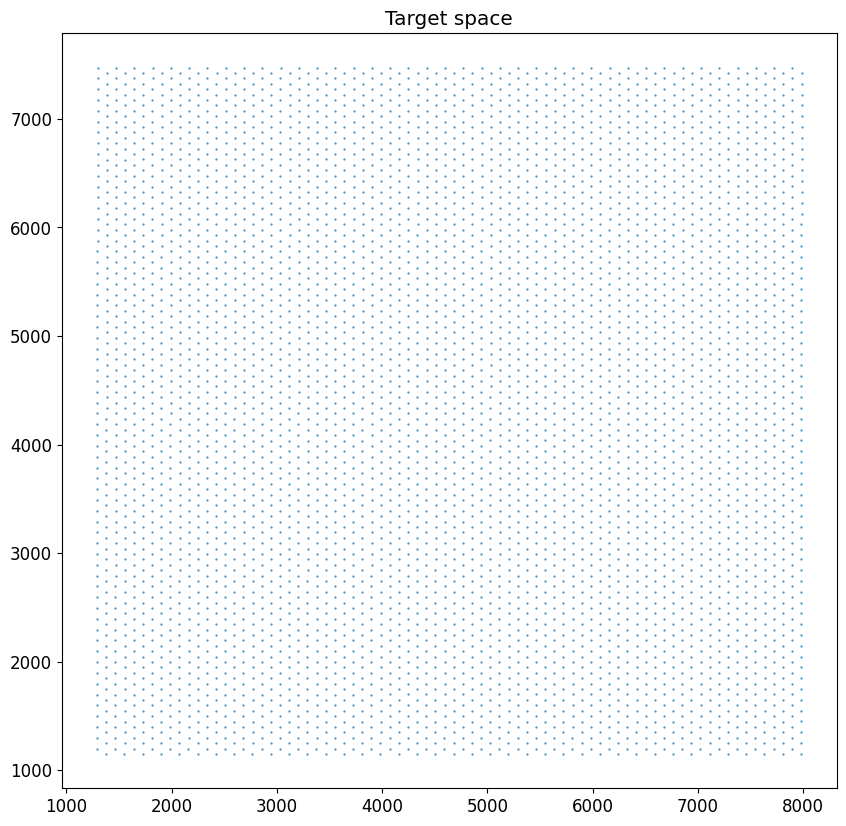

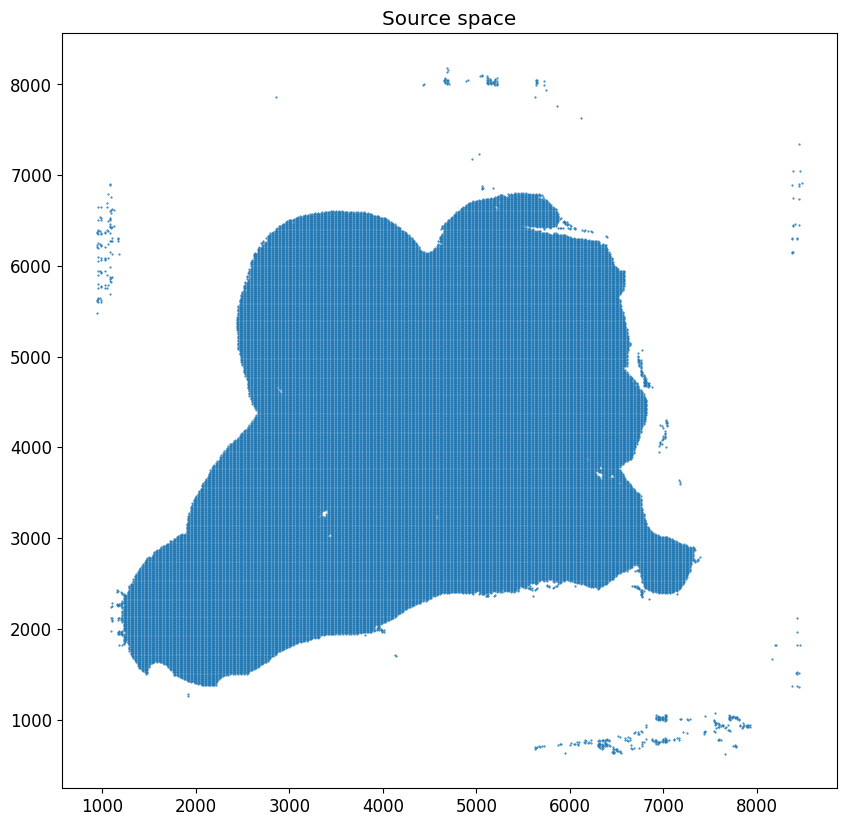

Migrating source annotation - annotations_level_0 to target space.
Migrating source annotation - annotations_level_0_number to target space.
Migrating source annotation - annotations_level_1 to target space.
Migrating source annotation - annotations_level_1_number to target space.
Migrating source annotation - annotations_lobules_0 to target space.
Migrating source annotation - annotations_lobules_0_number to target space.
Migrating source annotation - L2_dist_annotations_level_0_Cortex to target space.
Migrating source annotation - L2_dist_annotations_level_0_Edge to target space.
Migrating source annotation - L2_dist_annotations_level_0_Medulla to target space.
Migrating source annotation - L2_dist_annotations_level_1_HS to target space.
Migrating source annotation - L2_dist_annotations_level_1_PVS to target space.
Migrating source annotation - L2_dist_annotations_level_1_unassigned to target space.


,in_tissue,2,3,y,x,annotations_level_0,annotations_level_0_number,annotations_level_1,annotations_level_1_number,annotations_lobules_0,annotations_lobules_0_number,L2_dist_annotations_level_0_Cortex,L2_dist_annotations_level_0_Edge,L2_dist_annotations_level_0_Medulla,L2_dist_annotations_level_1_HS,L2_dist_annotations_level_1_PVS,L2_dist_annotations_level_1_unassigned
barcode,,,,,,,,,,,,,,,,,
ACGCCTGACACGCGCT-1,0.0,0.0,0.0,8235.981341,1429.406785,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TACCGATCCAACACTT-1,0.0,1.0,1.0,8181.129249,1525.123399,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ATTAAAGCGGACGAGC-1,0.0,0.0,2.0,8126.267688,1429.310194,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GATAAGGGACGATTAG-1,0.0,1.0,3.0,8071.415597,1525.026809,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GTGCAAATCACCAATA-1,0.0,0.0,4.0,8016.554035,1429.213604,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAACGTTTGTATCCAC-1,0.0,77.0,123.0,1488.956271,8797.364513,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ATTGAATTCCCTGTAG-1,0.0,76.0,124.0,1434.094710,8701.551308,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TACCTCACCAATTGTA-1,0.0,77.0,125.0,1379.242618,8797.267923,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
df_visium_spot,ppm_visium = ims.read_visium_table(vis_path)
ims.map_annotations_to_target(df_source=df_morph, df_target=df_visium_spot, ppm_source=ppm_morph,ppm_target=ppm_visium)

In [68]:
import scanpy as sc
adata_vis = sc.read_h5ad(vis_path+'corrected_raw_adata.h5ad')
adata_vis.obs.index.rename('barcode',inplace=True)
adata_vis.obs = pd.concat([adata_vis.obs,df_visium_spot.iloc[:,3:]],axis=1)
adata_vis.obs

,in_tissue,array_row,array_col,y,x,annotations_level_0,annotations_level_0_number,annotations_level_1,annotations_level_1_number,annotations_lobules_0,annotations_lobules_0_number,L2_dist_annotations_level_0_Cortex,L2_dist_annotations_level_0_Edge,L2_dist_annotations_level_0_Medulla,L2_dist_annotations_level_1_HS,L2_dist_annotations_level_1_PVS,L2_dist_annotations_level_1_unassigned
barcode,,,,,,,,,,,,,,,,,
AAACAACGAATAGTTC-1,0.0,0.0,16.0,7358.272118,1428.634063,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACAAGTATCTCCCA-1,0.0,50.0,102.0,2640.821786,6212.726156,Edge,4.0,unassigned,1.0,unassigned,1.0,78.028089,19.914260,263.340506,314.270874,321.197781,0.0
AAACAATCTACTAGCA-1,0.0,3.0,43.0,5877.152009,1714.624824,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACACCAATAACTGC-1,0.0,59.0,19.0,7193.980993,7078.618834,None,NaN,None,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACAGAGCGACTCCT-1,1.0,14.0,94.0,3079.505944,2765.575777,Cortex,2.0,unassigned,1.0,lobule_2,3.0,10.108174,16.080995,124.163042,442.883491,142.170166,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1.0,58.0,42.0,5932.269250,6981.743137,Cortex,2.0,unassigned,1.0,lobule_7,8.0,8.885462,56.528941,203.158587,256.995187,164.054630,0.0
TTGTTTCATTAGTCTA-1,1.0,60.0,30.0,6590.560637,7173.852497,Edge,4.0,unassigned,1.0,lobule_10,11.0,30.506210,10.290928,416.715700,473.389181,455.033883,0.0
TTGTTTCCATACAACT-1,1.0,45.0,27.0,6755.060094,5737.523741,Cortex,2.0,unassigned,1.0,lobule_9,10.0,8.885421,27.351396,282.075349,381.532596,529.405257,0.0


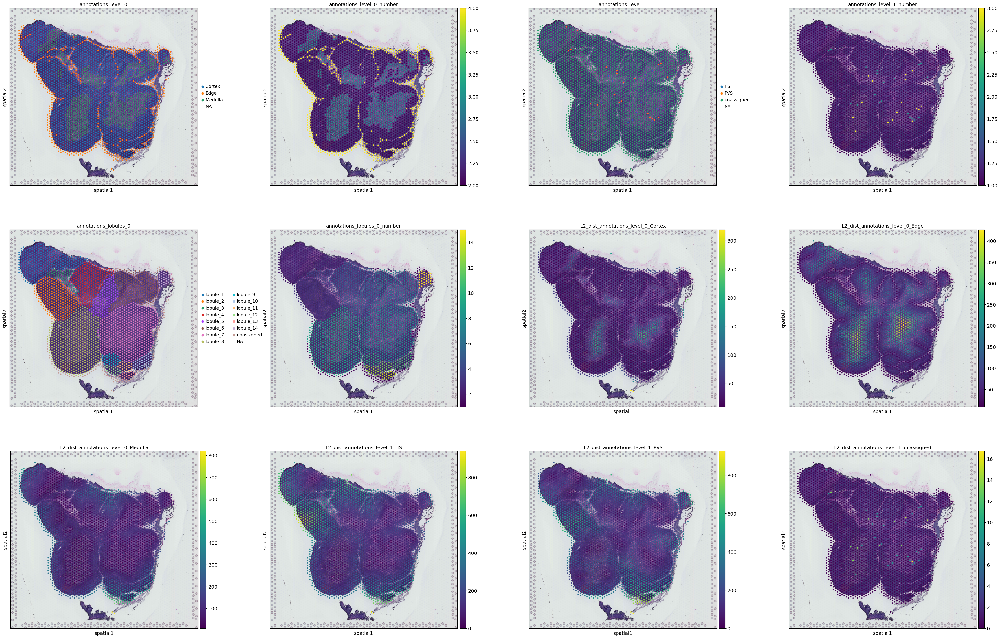

In [70]:
sc.set_figure_params(figsize=[10,10],dpi=50)
sc.pl.spatial(adata_vis,color=adata_vis.obs.columns[5:],ncols=4,wspace=0.25)

# axis part

In [71]:
# axis calculations on visium 
anno = 'annotations_level_0'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
adata_vis.obs = ims.calculate_axis_3p(adata_vis.obs, anno=anno, structure=structure, output_col='cma_v2', w=w)

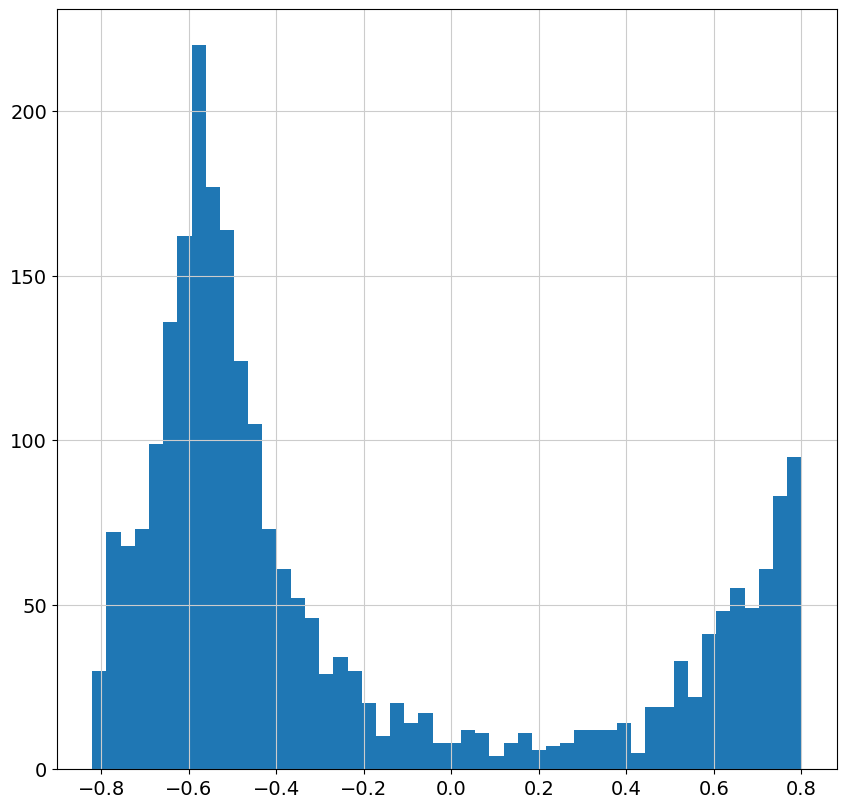

In [72]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
ct2_values = [-0.7,-0.6,-0.55,-0.4,-0.3,0.1,0.55,0.65,0.7,0.74]

adata_vis.obs = ims.bin_axis(ct_order ,ct2_values,adata_vis.obs,'cma_v2')   
adata_vis.obs.loc[adata_vis.obs[anno]=='Edge','manual_bin_cma_v2'] = 'Capsular'
adata_vis.obs['manual_bin_cma_v2'].value_counts()
adata_vis.obs['cma_v2'].hist(bins=50)
plt.show()

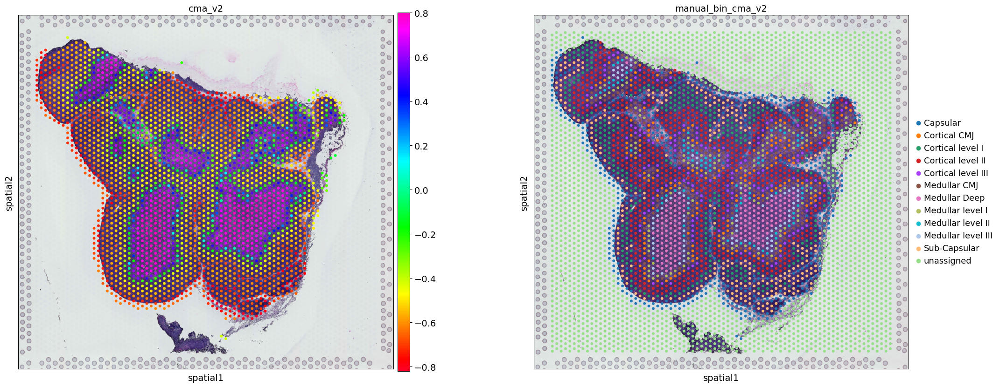

In [76]:
# plotting 
sc.pl.spatial(adata_vis,color=['cma_v2','manual_bin_cma_v2'],ncols=4,wspace=0.25,cmap='gist_rainbow')

In [77]:
adata_vis.write(vis_path+'adata_cma_v2.h5ad')